# Youtube Watch History Prediction using RNNs

We will explore how different RNN models would do for our sequential titles of watch history. In the first main part, we will execute sentence embedding using transformer-based model. Afterwards, we will use the embedding as a feature and implement LSTM, RNN, GRU to examine how they compare to each other. The data was obtained through Google TakeOut and Youtube API. The former provides user's Youtube History data consisting of the title and the time while the latter provides meta data of any videos.

In [90]:
import pandas as pd

# Importing data
df = pd.read_json("/Users/chinguunganbaatar/Documents/156data/watch-history-user1.json")

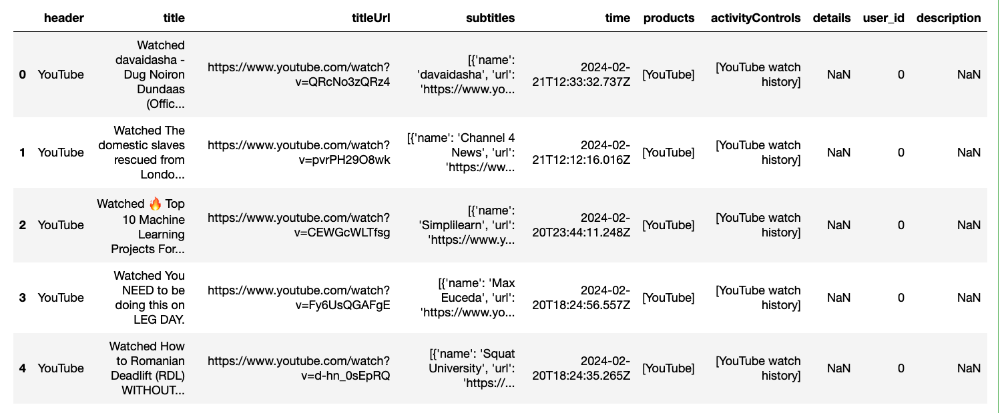

In [93]:
from IPython.display import Image

Image("/Users/chinguunganbaatar/Documents/156data/156_1.png")

In [2]:
#Deleting Null data

print(df.shape)
df = df[~df["title"].str.contains("https", na=False)]
print(df.shape)
df = df[~df["title"].str.contains("that has been removed", na=False)]
print(df.shape)
df = df[df['titleUrl'].notna()] #This removes Ads as well
print(df.shape)
df = df[~df["title"].str.contains("#shorts", na=False)]
print(df.shape)
df = df.dropna(subset=['title']).reset_index(drop=True)

(34884, 8)
(33448, 8)
(33191, 8)
(33187, 8)
(31538, 8)


In [82]:
#Used for extracting the Video IDs so I can use it to fetch data from Youtube API

import re

def extract_video_id(url):
    # Regular expression patterns for different YouTube URL formats
    patterns = [
        r'youtube\.com/watch\?v=([^\&\?\/]+)',  # Standard format
        r'youtu\.be/([^\&\?\/]+)',              # Shortened format
        r'youtube\.com/embed/([^\&\?\/]+)',     # Embed format
        r'youtube\.com/v/([^\&\?\/]+)',         # Legacy format
        r'youtube\.com/watch\?.*v=([^\&\?\/]+)',# Standard format with additional parameters
    ]
    
    for pattern in patterns:
        match = re.search(pattern, url)
        if match:
            return match.group(1)
    return None  # Return None if no video ID is found

In [ ]:
details_df = pd.read_csv('/Users/chinguunganbaatar/Documents/156data/Video_Details.csv')

## Cleaning, Pre-processing, and Feature Engineering

In the previous section, we already deleted rows with Null values because we didn't want to waste API quota limits for unusable data points when fetching the meta data from Youtube. Firstly, we will preprocess the title text by: 
- Mapping Unicode texts into most closes ASCII forms. Most importantly, it converts other scripts into Latin scripts
- Lowercasing and replacing specific characters prevalent in Youtube titles such as brackets to make as normal as possible sentences
- Combining the title and channel strings for richer content

We then execute word embedding using transformer-based model of Universal Sentence Encoder (USE) from TensorFlowHub. After embedding, we would map them back to our original data so to combine it with its temporal column. Here, we do time pre-processing and extracts sessions_ids as we did in the last assignments. 

Now for the details in our embedding model, ***The UniversalSentenceEncoder*** processes texts by first converting each text into token embeddings using the ***EmbeddingLookup***, which translates text tokens into vector representations. These embeddings are then enriched with positional information through the ***AddPositionalEncoding***, ensuring the model recognizes token order within sentences. These positioned embeddings pass through several ***Transformer*** layers, each comprising ***MultiHeadAttention*** for capturing diverse contextual relationships by processing inputs into multiple attention heads, and a feed-forward network for non-linear transformations. The output of the final ***Transformer*** layer is then averaged using ***MeanPooling*** to produce a single embedding for each text:

#### Function: Universal Sentence Encoder
-----

```plaintext
function UniversalSentenceEncoder(texts):
    Initialize embeddings, position_encodings
    for each text in texts:
        token_embeddings = EmbeddingLookup(text)
        positional_embeddings = AddPositionalEncoding(token_embeddings)
        
        transformer_output = positional_embeddings
        for i in range(number_of_layers):
            transformer_output = TransformerLayer(transformer_output)
        
        sentence_embedding = MeanPooling(transformer_output)
        
        store sentence_embedding in sentence_embeddings
    return sentence_embeddings

function TransformerLayer(input):
    attention_output = MultiHeadAttention(input, input, input)
    input_with_attention = LayerNorm(input + attention_output)
    ffn_output = FeedForwardNetwork(input_with_attention)
    transformer_layer_output = LayerNorm(input_with_attention + ffn_output)
    return transformer_layer_output

function MultiHeadAttention(Q, K, V):
    heads = []
    for each head in range(num_heads):
        Q_head = Q * W_Q[head]
        K_head = K * W_K[head]
        V_head = V * W_V[head]

        attention_scores = Softmax((Q_head * K_head.T) / sqrt(d_k))
        attention_head = attention_scores * V_head
        heads.append(attention_head)

    multi_head_output = Concatenate(heads) * W_O
    return multi_head_output

function FeedForwardNetwork(input):
    intermediate = ReLU(input * W_1 + b_1)
    ffn_output = intermediate * W_2 + b_2
    return ffn_output
    
function EmbeddingLookup(text):
    tokens = Tokenize(text)
    embeddings = Lookup(tokens, embedding_matrix)
    return embeddings

function AddPositionalEncoding(embeddings):
    for i in range(length(embeddings)):
        embeddings[i] += PositionalEncoding(i)
    return embeddings

function MeanPooling(transformer_output):
    mean_embedding = Average(transformer_output)
    return mean_embedding


In [10]:
from unidecode import unidecode
import string

def preprocess_title(title):
    # Normalize Unicode characters to ASCII (e.g., aesthetic spacing)
    title = unidecode(title)
    # Convert to lowercase
    title = title.lower()
    # Remove specific characters: brackets, dashes, and quotes
    title = title.replace('[', ' ').replace(']', ' ').replace('-', ' ').replace('"', ' ')
    # Remove all other punctuation using string translation
    title = title.translate(str.maketrans('', '', string.punctuation))
    # Remove extra whitespace
    title = ' '.join(title.split())
    return title



In [11]:
details_df['title_channel'] = details_df['title'] + " " + details_df['channel_name']
details_df['processed_title_channel'] = details_df['title_channel'].apply(preprocess_title)
details_df.head()

,video_id,title,channel_name,category_id,duration,thumbnail_url,title_channel,processed_title_channel
0,jQa2YDdn3Xs,One-hand hero Phearak’s Bold Challenge to Conf...,MLBB eSports,20,PT58S,https://i.ytimg.com/vi/jQa2YDdn3Xs/hqdefault.jpg,One-hand hero Phearak’s Bold Challenge to Conf...,one hand hero phearaks bold challenge to confr...
1,gE7JDxebBfw,“I Will Debate Anyone”,BigDawsTv,23,PT32S,https://i.ytimg.com/vi/gE7JDxebBfw/hqdefault.jpg,“I Will Debate Anyone” BigDawsTv,i will debate anyone bigdawstv
2,h3XYCGfsZBg,Alleyway Parkour Slide? 🛝,Matt Larose,17,PT1M,https://i.ytimg.com/vi/h3XYCGfsZBg/hqdefault.jpg,Alleyway Parkour Slide? 🛝 Matt Larose,alleyway parkour slide matt larose
3,_82BDL3b53w,Professor Brian Greene talks about higher dime...,The Science Fact,28,PT49S,https://i.ytimg.com/vi/_82BDL3b53w/hqdefault.jpg,Professor Brian Greene talks about higher dime...,professor brian greene talks about higher dime...
4,MWaQo6olYxc,I’m already blocked so… @dojacat,Haley Kalil,22,PT8S,https://i.ytimg.com/vi/MWaQo6olYxc/hqdefault.jpg,I’m already blocked so… @dojacat Haley Kalil,im already blocked so dojacat haley kalil


In [12]:
import tensorflow_hub as hub


#Load the Universal Sentence Encoder's Transformer version
use = hub.load("https://tfhub.dev/google/universal-sentence-encoder-large/4")

In [ ]:
embeddings_tensor = embeddings['outputs']

# Convert the TensorFlow tensor to a numpy array

embeddings_array = embeddings_tensor.numpy()

In [17]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=50, n_iter=300, random_state=42) #I fine-tuned the perplexity
tsne_results = tsne.fit_transform(embeddings_array)

details_df['tsne-2d-one'] = tsne_results[:, 0]
details_df['tsne-2d-two'] = tsne_results[:, 1]

In [18]:
import plotly.express as px

# Create the scatter plot
fig = px.scatter(details_df, x='tsne-2d-one', y='tsne-2d-two',
                  color=details_df['category_id'].astype(str),  # Use 'category_id' to color code the points
                 hover_data=['title', 'channel_name'],
                 title='t-SNE Visualization of Sentence Embeddings',
                 labels={'tsne-2d-one': 't-SNE Dimension 1', 'tsne-2d-two': 't-SNE Dimension 2'})  # Optional: Choose a color scale

# Update marker appearance for better visibility
fig.update_traces(marker=dict(size=5, opacity=0.7, line=dict(width=0.5, color='DarkSlateGrey')))
fig.update_layout(legend_title_text='Category ID')

# Show the plot
fig.show()

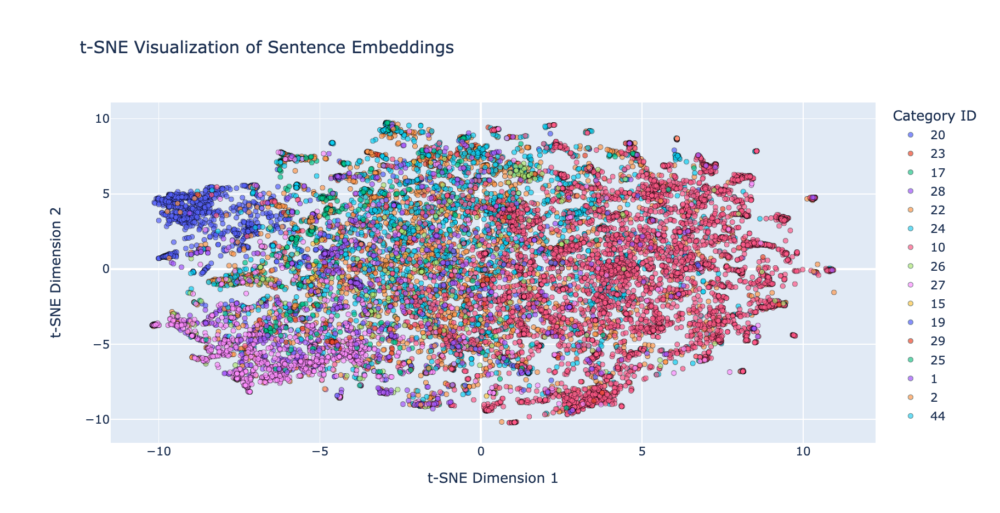

In [94]:
Image("/Users/chinguunganbaatar/Documents/156data/embedding.png")

In [77]:
#Fetching 'embedding' into original df
details_df['embeddings'] = list(embeddings_array)
combined_df = df.merge(details_df[['video_id', 'embeddings']], on='video_id', how='left')

In [ ]:
#deleting nan values
combined_df.dropna(subset=['embeddings'], inplace=True)
#preprocess time and extract session_id feature with >30 minutes for inactiveness
combined_df['time'] = pd.to_datetime(combined_df['time'].str.replace(r'\.\d+Z', 'Z', regex=True))
combined_df['time_diff'] = combined_df['time'].diff().dt.total_seconds().fillna(0).abs()
combined_df['session_id'] = (combined_df['time_diff'] > 1800).cumsum() + 1

## Task Discussion

Our task is to predict the next embedded vector based on the previous points in the session, which ultimately is a regression task. We are essentially interested in how well these sequential models can be predicted through RNN given the embedded feature. We pad some of the sequences so to match the dimensions.

In [30]:
# Group by session and create sequences
X = []
Y = []

for session_id, session in combined_df.groupby('session_id'):
    embeddings = np.stack(session['embeddings'])  # Convert list of arrays into a 2D array
    for i in range(1, embeddings.shape[0]):
        X.append(embeddings[:i])  # Take all embeddings up to the i-th as the sequence
        Y.append(embeddings[i])   # Predict the next embedding

# Padding sequences to have the same length
from tensorflow.keras.preprocessing.sequence import pad_sequences

max_sequence_length = 30 
X_padded = pad_sequences(X, maxlen=max_sequence_length, padding='post', truncating='post', dtype='float32')
Y = np.array(Y)

# Split into training and validation sets
from sklearn.model_selection import train_test_split
X_train, X_valid, Y_train, Y_valid = train_test_split(X_padded, Y, test_size=0.2, random_state=42)


## Model Selections

First of all, we will use **cosine  similarity** as our loss function for each models. The objective is to minimize the angle between the predicted vector and the target vector, which maximizes the cosine of the angle between them. Since cosine similarity measures the cosine of the angle, maximizing this value (making it closer to 1) effectively minimizes the angle between the vectors.

### Mathematical Formulation

Given predicted vector **y_pred** and true vector **y_true**, the cosine similarity can be expressed as:

    CosineSimilarity(y_pred, y_true) = (y_pred · y_true) / (||y_pred|| * ||y_true||)

To use it as a loss function, we  maximize the cosine similarity, or equivalently, minimizes the negative of the cosine similarity:

    Loss = 1 - CosineSimilarity(y_pred, y_true)

As for our models, let's first dive into Simple RNN. Ultimately, Simple RNN's each hidden state is calculated using only the current input and the previous hidden state, transformed through a weight matrix $W$ and $U$, and a bias $b$. The output of each state is then normalized with hyporbolic tangent (Tanh) function. Ultimately, the hidden state at each time step is calculated based on the previous hidden state and the current input.

GRU enhance this architecture by introducing the update gate and the reset gate. The former decides how much past information to pass forward while the latter decides how much past information to forget. This essentially makes a model that is capable of learning from longer sequences more effectively.

Lastly, LSTM introduces input gate, forget gate, and output gate. Input gate controls the extent to which a new value flows into the cell while forget gate allows the cell to discard. Output Gate determines the part of the cell state to output based on the input and the memory of the cell. This system is essentially more optimized architure on to decide what information to keep, forget, or pass through.


#### Simple RNN Pseudocode
----
```plaintext
function BuildRNNModel(input_shape):
    # Initialize the model using the Sequential API
    Initialize model as a new Sequential instance
    
    # Add an Input layer
    model.Add(InputLayer(shape=input_shape))
    
    # Add a Simple RNN layer
    model.Add(RNN(units=100, return_sequences=False))
    
    # Add a Dense layer
    model.Add(Dense(units=embedding_size))
    
    # Compile the model
    model.Compile(optimizer='adam', loss='cosine_similarity')
    
    return model

# RNN Layer detailed operations
function RNN(inputs, units):
    # Initialize weights for the basic RNN cell
    Initialize W, U, b
    
    previous_hidden_state = 0
    
    for each input in inputs:
        # Update the hidden state
        current_hidden_state = Tanh(W * input + U * previous_hidden_state + b)
        
        # Move to the next state
        previous_hidden_state = current_hidden_state
    
    return previous_hidden_state



#### Gated Recurrent Unit Pseudocode
----

```plaintext

function GRU(inputs, units):
    Initialize Wz, Wr, Wh
    Initialize Uz, Ur, Uh
    Initialize bz, br, bh
    
    previous_hidden_state = 0
    
    for each input in inputs:
        # Update gate
        update_gate = Sigmoid(Wz * input + Uz * previous_hidden_state + bz)
        
        # Reset gate
        reset_gate = Sigmoid(Wr * input + Ur * previous_hidden_state + br)
        
        # Candidate hidden state
        candidate_state = Tanh(Wh * input + Uh * (reset_gate * previous_hidden_state) + bh)
        
        # Final hidden state update
        current_hidden_state = update_gate * previous_hidden_state + (1 - update_gate) * candidate_state
        
        # Update states
        previous_hidden_state = current_hidden_state
    
    return previous_hidden_state






#### LSTM Pseudocode
----

```plaintext

function BuildLSTMModel(input_shape):
    # Initialize the model using the Sequential API
    Initialize model as a new Sequential instance
    
    # Add an Input layer
    model.Add(InputLayer(shape=input_shape))
    
    # Add an LSTM layer
    model.Add(LSTM(units=100, return_sequences=False))
    
    # Add a Dense layer
    model.Add(Dense(units=embedding_size))
    
    # Compile the model
    model.Compile(optimizer='adam', loss='cosine_similarity')
    
    return model

# LSTM Layer detailed operations
function LSTM(inputs, units):
    # Initialize weights for input, forget, cell, and output gates
    Initialize Wi, Wf, Wc, Wo
    Initialize Ui, Uf, Uc, Uo
    Initialize bi, bf, bc, bo
    
    previous_hidden_state = 0
    previous_cell_state = 0
    
    for each input in inputs:
        # Input gate
        input_gate = Sigmoid(Wi * input + Ui * previous_hidden_state + bi)
        
        # Forget gate
        forget_gate = Sigmoid(Wf * input + Uf * previous_hidden_state + bf)
        
        # Cell gate
        cell_gate = Tanh(Wc * input + Uc * previous_hidden_state + bc)
        
        # Output gate
        output_gate = Sigmoid(Wo * input + Uo * previous_hidden_state + bo)
        
        # Update the cell state
        current_cell_state = forget_gate * previous_cell_state + input_gate * cell_gate
        
        # Compute the current hidden state
        current_hidden_state = output_gate * Tanh(current_cell_state)
        
        # Update states
        previous_hidden_state = current_hidden_state
        previous_cell_state = current_cell_state
    
    return previous_hidden_state

# Dense Layer detailed operations
function Dense(inputs, units):
    # Initialize weights and biases
    Initialize W, b
    
    # Linear transformation
    output = inputs * W + b
    
    # Non-linearity (activation function)
    result = ActivationFunction(output)  # Activation might be ReLU, Sigmoid, etc., depending on the layer specifics
    
    return result


## Training

In [32]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input

embedding_size=512

def build_lstm_model(input_shape):
    model = Sequential([
        Input(shape=input_shape),
        LSTM(100, return_sequences=False),
        Dense(embedding_size)
    ])
    model.compile(optimizer='adam', loss='cosine_similarity')
    return model


input_shape = (None, embedding_size)  # None allows the model to accept any sequence length
lstm_model = build_lstm_model(input_shape)


In [33]:
lstm_history = lstm_model.fit(X_train, Y_train, validation_data=(X_valid, Y_valid), epochs=20, batch_size=128)

Epoch 1/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: -0.3285 - val_loss: -0.3843
Epoch 2/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: -0.3842 - val_loss: -0.3931
Epoch 3/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: -0.3966 - val_loss: -0.3995
Epoch 4/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: -0.4024 - val_loss: -0.4014
Epoch 5/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: -0.4049 - val_loss: -0.4084
Epoch 6/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: -0.4123 - val_loss: -0.4097
Epoch 7/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: -0.4135 - val_loss: -0.4118
Epoch 8/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: -0.4165 - val_loss: -0.4134
Epoch 9/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: -0.4198 - val_loss: -0.4156
Epoch 10/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: -0.4203 - val_loss: -0.4164
Epoch 11/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: -0.4254 - val_loss: -0.4179
Epoch 12/20
175/175

In [34]:
from tensorflow.keras.layers import SimpleRNN

def build_rnn_model(input_shape):
    model = Sequential([
        SimpleRNN(100, return_sequences=False, input_shape=input_shape),
        Dense(embedding_size)
    ])
    model.compile(optimizer='adam', loss='cosine_similarity')
    return model

rnn_model = build_rnn_model(input_shape)
rnn_history = rnn_model.fit(X_train, Y_train, validation_data=(X_valid, Y_valid), epochs=20, batch_size=128)


/Users/chinguunganbaatar/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: -0.3045 - val_loss: -0.3702
Epoch 2/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: -0.3689 - val_loss: -0.3707
Epoch 3/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: -0.3692 - val_loss: -0.3690
Epoch 4/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: -0.3671 - val_loss: -0.3779
Epoch 5/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: -0.3760 - val_loss: -0.3831
Epoch 6/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: -0.3824 - val_loss: -0.3868
Epoch 7/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: -0.3871 - val_loss: -0.3902
Epoch 8/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: -0.3942 - val_loss: -0.3912
Epoch 9/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: -0.3949 - val_loss: -0.3928
Epoch 10/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: -0.4002 - val_loss: -0.3936
Epoch 11/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: -0.4022 - val_loss: -0.3979
Epoch 12/20
175/175

In [35]:
from tensorflow.keras.layers import GRU

def build_gru_model(input_shape):
    model = Sequential([
        GRU(100, return_sequences=False, input_shape=input_shape),
        Dense(embedding_size)
    ])
    model.compile(optimizer='adam', loss='cosine_similarity')
    return model

gru_model = build_gru_model(input_shape)
gru_history = gru_model.fit(X_train, Y_train, validation_data=(X_valid, Y_valid), epochs=20, batch_size=128)


Epoch 1/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: -0.3244 - val_loss: -0.3710
Epoch 2/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: -0.3697 - val_loss: -0.3745
Epoch 3/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: -0.3736 - val_loss: -0.3864
Epoch 4/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: -0.3866 - val_loss: -0.3925
Epoch 5/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: -0.3934 - val_loss: -0.3996
Epoch 6/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: -0.4006 - val_loss: -0.4017
Epoch 7/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: -0.4065 - val_loss: -0.4051
Epoch 8/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: -0.4122 - val_loss: -0.4066
Epoch 9/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: -0.4110 - val_loss: -0.4093
Epoch 10/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: -0.4143 - val_loss: -0.4112
Epoch 11/20
175/175 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: -0.4185 - val_loss: -0.4130
Epoch 12/20
175/175

## Performance

In [46]:
lstm_predictions = lstm_model.predict(X_test)
rnn_predictions = rnn_model.predict(X_test)
gru_predictions = gru_model.predict(X_test)



175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


In [47]:
from sklearn.manifold import TSNE

def reduce_dimensions(embeddings):
    tsne = TSNE(n_components=2, random_state=42)
    reduced_embeddings = tsne.fit_transform(embeddings)
    return reduced_embeddings

# Flatten the embeddings for dimensionality reduction
Y_test_flat = Y_test.reshape(Y_test.shape[0], -1)
lstm_predictions_flat = lstm_predictions.reshape(lstm_predictions.shape[0], -1)
rnn_predictions_flat = rnn_predictions.reshape(rnn_predictions.shape[0], -1)
gru_predictions_flat = gru_predictions.reshape(gru_predictions.shape[0], -1)

# Apply t-SNE
Y_test_reduced = reduce_dimensions(Y_test_flat)
lstm_reduced = reduce_dimensions(lstm_predictions_flat)
rnn_reduced = reduce_dimensions(rnn_predictions_flat)
gru_reduced = reduce_dimensions(gru_predictions_flat)


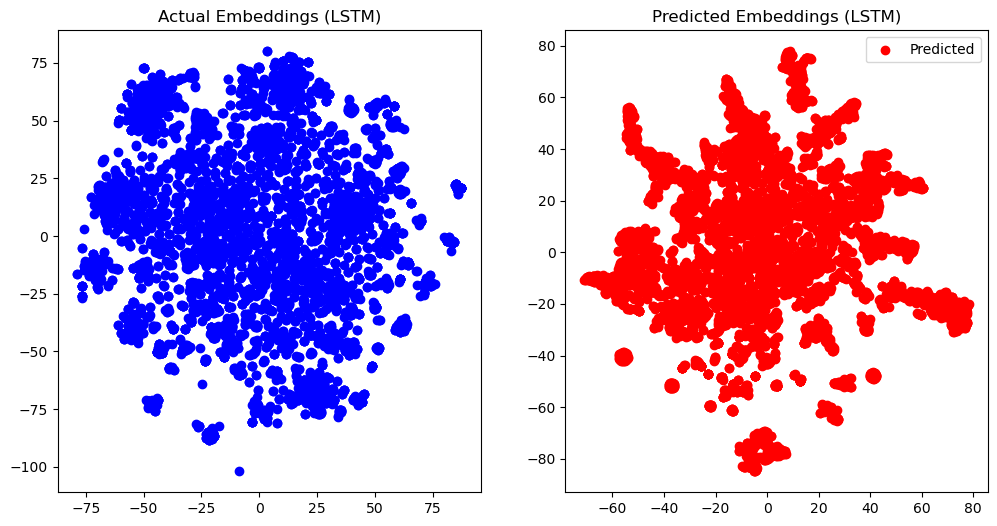

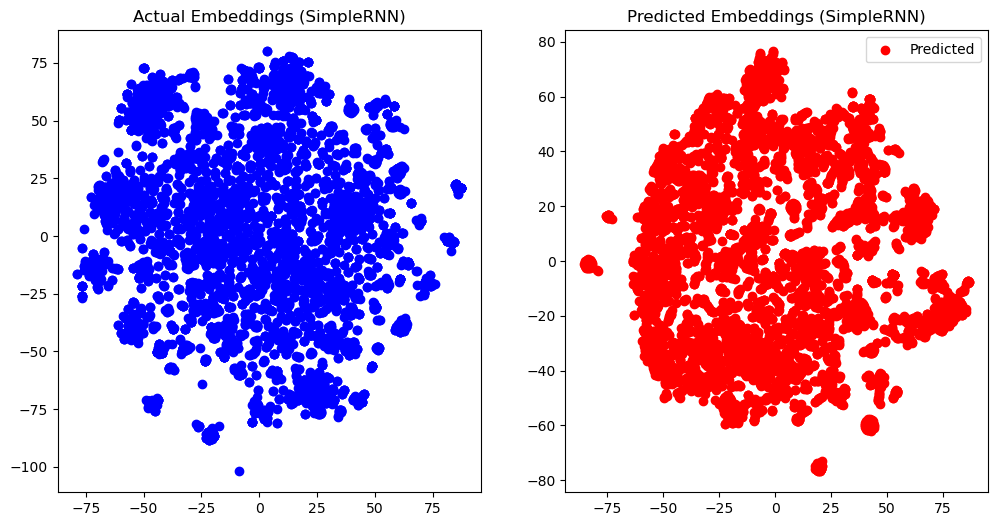

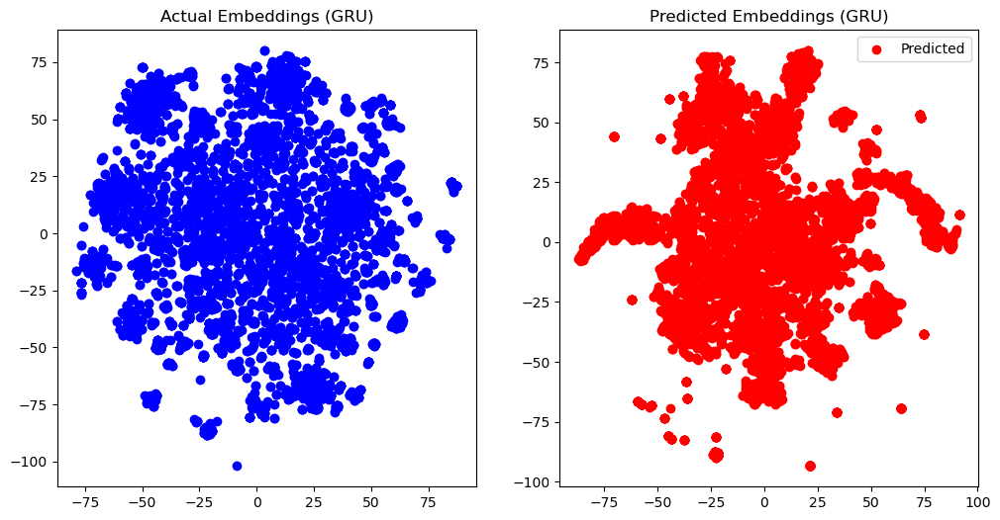

In [48]:
import matplotlib.pyplot as plt

def plot_embeddings(actual, predicted, title):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.scatter(actual[:, 0], actual[:, 1], c='blue', label='Actual')
    plt.title(f'Actual Embeddings ({title})')
    
    plt.subplot(1, 2, 2)
    plt.scatter(predicted[:, 0], predicted[:, 1], c='red', label='Predicted')
    plt.title(f'Predicted Embeddings ({title})')

    plt.legend()
    plt.show()

# Plot for LSTM
plot_embeddings(Y_test_reduced, lstm_reduced, 'LSTM')

# Plot for SimpleRNN
plot_embeddings(Y_test_reduced, rnn_reduced, 'SimpleRNN')

# Plot for GRU
plot_embeddings(Y_test_reduced, gru_reduced, 'GRU')


In [70]:
# Get predictions from each model
lstm_preds = lstm_model.predict(X_valid)
rnn_preds = rnn_model.predict(X_valid)
gru_preds = gru_model.predict(X_valid)

# Calculate similarity metric (e.g., cosine similarity) between predicted and actual embeddings
from sklearn.metrics.pairwise import cosine_similarity

# Calculate cosine similarity for LSTM model
lstm_similarity = cosine_similarity(Y_valid, lstm_preds)

# Calculate cosine similarity for SimpleRNN model
rnn_similarity = cosine_similarity(Y_valid, rnn_preds)

# Calculate cosine similarity for GRU model
gru_similarity = cosine_similarity(Y_valid, gru_preds)

# Print average similarity for each model
print("Average Cosine Similarity - LSTM:", lstm_similarity.mean())
print("Average Cosine Similarity - SimpleRNN:", rnn_similarity.mean())
print("Average Cosine Similarity - GRU:", gru_similarity.mean())


175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Average Cosine Similarity - LSTM: 0.317463
Average Cosine Similarity - SimpleRNN: 0.32820198
Average Cosine Similarity - GRU: 0.31780365


## Conclusion

The loss trends over epochs shows consistent decrease in bot training and validation loss, which suggests that the model was learning effectively without overfitting significantly. LSTMs were likely most effective in capturing the temporal dependencies in our data. This is informative, especially for predicting future viewing patterns based on past behavior, as LSTMs can maintain state information over semantic embedding between the titles over long sequence, making them ideal for the detailed and varied durations for future prediction models. GRUs also came close LSTM while being computationally more efficient than LSTM. 

In [67]:
# Evaluate LSTM model
lstm_loss = lstm_model.evaluate(X_valid, Y_valid)

# Evaluate SimpleRNN model
rnn_loss = rnn_model.evaluate(X_valid, Y_valid)

# Evaluate GRU model
gru_loss = gru_model.evaluate(X_valid, Y_valid)

print("Validation Loss - LSTM:", lstm_loss)
print("Validation Loss - SimpleRNN:", rnn_loss)
print("Validation Loss - GRU:", gru_loss)


175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: -0.4199
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: -0.4038
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: -0.4178
Validation Loss - LSTM: -0.4218393862247467
Validation Loss - SimpleRNN: -0.40548157691955566
Validation Loss - GRU: -0.4194396138191223


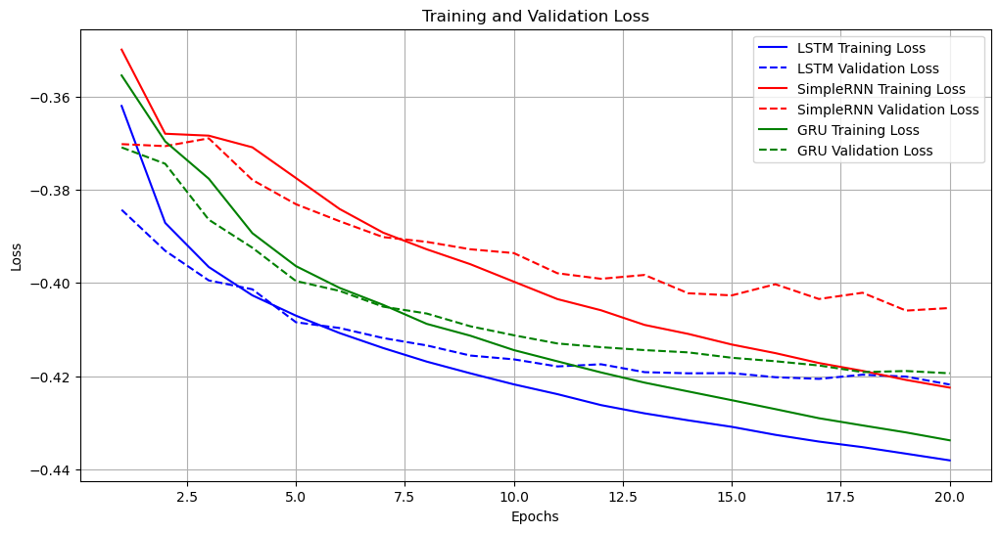

In [69]:
import matplotlib.pyplot as plt

# Extract loss history from the training history
lstm_train_loss = lstm_history.history['loss']
lstm_val_loss = lstm_history.history['val_loss']

rnn_train_loss = rnn_history.history['loss']
rnn_val_loss = rnn_history.history['val_loss']

gru_train_loss = gru_history.history['loss']
gru_val_loss = gru_history.history['val_loss']

# Plot training and validation loss for each model
epochs = range(1, len(lstm_train_loss) + 1)

plt.figure(figsize=(12, 6))
plt.plot(epochs, lstm_train_loss, 'b', label='LSTM Training Loss')
plt.plot(epochs, lstm_val_loss, 'b--', label='LSTM Validation Loss')
plt.plot(epochs, rnn_train_loss, 'r', label='SimpleRNN Training Loss')
plt.plot(epochs, rnn_val_loss, 'r--', label='SimpleRNN Validation Loss')
plt.plot(epochs, gru_train_loss, 'g', label='GRU Training Loss')
plt.plot(epochs, gru_val_loss, 'g--', label='GRU Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


## Executive Summary

We examined the word embedding technique with transformer-based model and used it as a feature to build 3 types of RNNs. Most of the hours was spent on exploring and delivering the embedding part. T-SNE visualization with categorical labels show how effective both the model and the visual worked out. Overall, the model and training part is relatively trivial because we don't have enough possibilities to demonstrate. Further extension is to do systematic tuning of parameters using approaches like grid search or random search could optimize learning outcomes, and most importantly, demonstrate how well the models work with other performance metrics fit to our data.

## References

Colah. (2015, August). Understanding LSTM Networks. Retrieved from [https://colah.github.io/posts/2015-08-Understanding-LSTMs/](https://colah.github.io/posts/2015-08-Understanding-LSTMs/)

TensorFlow. (n.d.). Semantic similarity with TF Hub Universal Encoder. Retrieved from https://www.tensorflow.org/hub/tutorials/semantic_similarity_with_tf_hub_universal_encoder

Olah, C. (2018, December 19). Illustrated Guide to LSTMs and GRU’s: A step-by-step explanation. Towards Data Science. Retrieved from https://towardsdatascience.com/illustrated-guide-to-lstms-and-gru-s-a-step-by-step-explanation-44e9eb85bf21


